<a href="https://colab.research.google.com/github/lidiador/YOLO3_object_detection/blob/main/Object_detection_YOLO3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Cel projektu

Projekt dotyczy rozwiązania problemu wyodrębniania i śledzenia obiektów (samochodów) w materiale źródłowym - pliku wideo. Każdy taki obiekt po wykryciu powinien otrzymywać ramkę ograniczającą (*bounding box*) możliwą do wskazania na kolejnych klatkach oraz unikalny identyfikator.


# 1. Dostępne metody

**SeqNMS**

Jest to jedna z metod opartych na postprocessingu klatek wideo stanowiących zbiór danych.
Do jej zalet zalicza się to, że wymaga stosunkowo niewielkiej infrastruktury, oraz nie wpływa na ogólną architekturę modelu (ponieważ stosuje się ją przy postprocessingu, nie wymaga ona uczenia). Podobnie jak inne metody "postprocessingowe", jest ona stosunkowo wolna (bo na wejściu jest przyjmowana tylko jedna klatka), ale za to dość dokładna. SeqNMS osiąga tę dokładność dzięki temu, że porównuje (dzięki programowaniu dynamicznemu) detekcje na aktualnie analizowanej klatce z wykryciami obiektów na innych klatkach w sekwencji (stąd nazwa: *SeqNMS*, *Sequence Non Maximal Suppression*). Jest to przydatne zwłaszcza do wykrywania obiektów częściowo zasłoniętych, gdyż można wzmocnić pewność detekcji takich obiektów przez porównanie z innymi klatkami w sekwencji, na których te obiekty mogą być niezasłonięte lub zasłonięte w mniejszej części.
SeqNMS nie jest jednak metodą optymalną, tak ze względu na szybkość, jak i na skuteczność: jej główną zaletą jest brak procesu uczenia i używana jest raczej jako swego rodzaju "dodatek", bo może być zastosowana w systemach detekcji opartych na innych metodach.

**Konwolucje w w 2D i 3D**

Jedną z najważniejszych grup algorytmów detekcji przedmiotów są tzw. metody analizy regionalnej: RCCN, Fast-RCCN, Faster-RCNN, RetinaNet, ostatnio Mask-RCNN. Ujmując rzecz skrótowo, analiza regionalna polega na wyodrębnieniu na obrazie jego części (regionów), gdzie mogą znajdować się obiekty, a następnie przeprowadzenia klasyfikacji tych obiektów za pomocą konwolucyjnych sieci neuronowych. Warto zauważyć, że podejście to może okazać się dość kosztowne obliczeniowo, gdyż algorytm taki zakłada przeprowadzenie predykcji z użyciem sieci neuronowych dla każdego z wyodrębnionych regionów, jednak metody te należą do najczęściej stosowanych w analizie wideo. Trwają badania nad zastosowaniem podobnego podejścia także do obrazów i wideo 3D, ale nie jest to, póki co, bardzo szeroko stosowana metoda i należy raczej do obszaru możliwych innowacji. Jedynym wyjątkiem jest dziedzina medycznej diagnostyki obrazowej - tam konwolucje w 3D są z powodzeniem stosowane do analizy trójwymiarowego zapisu z tomografii komputerowej. W innych dziedzinach problematyczna jest przede wszystkim niska szybkość działania wywołana złożonością obliczeniową, a w niektórych przypadkach także precyzja.

**Rekurencyjne sieci neuronowe (RNN)**

Podjęte zostały próby użycia rekurencyjnych sieci neuronowych do detekcji wideo, jednak technologia taka wciąż pozostaje w obszarze badań i RNN stosuje się głównie w przetwarzaniu języka naturalnego (NLP), gdzie zbiory danych są sekwencyjne (bo są to ciągi znaków tworzące słowa). Założenie stojące za próbami użycia rekurencyjnych sieci neuronowych do detekcji obiektów na filmach wideo głosi, że filmy te również są sekwencjami klatek, więc teoretycznie RNN jest metodą dającą się tu zastosować. Dotychczasowe rezultaty wydają się obiecujące, metody oparte na RNN nie stały się jednak jeszcze standardem w tym obszarze, na co wpływ ma między innymi ich stosunkowo duża złożoność obliczeniowa.

**Przepływ optyczny**

Istnieje cała grupa metod detekcji obrazu wideo oparta na koncepcji przepływu optycznego. Z matematycznego punktu widzenia przepływ optyczny to pole (w rozumieniu teorii pola będącej częścią analizy matematycznej) wektorów ruchu wyznaczane między dwoma obrazami w sekwencji wideo. Mówiąc bardziej potocznie, przepływ optyczny pozwala oszacować rzeczywisty lub pozorny ruch obiektów między dwiema klatkami wideo (ruch pozorny powodowany jest przez ruch kamery) - otrzymujemy pole, w którym każdy wektor reprezentuje przesunięcie piksela pomiędzy poszczególnymi klatkami. Jedna z metod opartych na przepływie optycznym (*Sparse Feature Propagation*) jest szeroko stosowana w rozpoznawaniu twarzy i badania wskazują, że da się ją zastosować szerzej do detekcji obiektów, jednak metodę cechuje nieco obniżona dokładność, jest ona za to dość szybka. Z kolei inna metoda oparta na przepływie optycznym, agregacja wieloklatkowa (*Multi Frame Aggregation*), jest jeszcze na tyle nowym pomysłem, że trudno ocenić jej niezawodność. Podobnie jak SeqNMS, obie te metody nadają się do zastosowania jako dodatkowe w systemach detekcji opartych na innych założeniach. 

Powyższy przegląd metod oparłem w dużej mierze na [tym artykule](https://towardsdatascience.com/ug-vod-the-ultimate-guide-to-video-object-detection) - tam też obszerna bibliografia.








# 2. Wybrana metoda detekcji - YOLO

Algorytm detekcji i klasyfikacji przedmiotów YOLO (*You Only Look Once*) opiera się na regresji. W tej mierze różni się on od innych popularnych algorytmów detekcji, które opierają się na klasyfikacji, takich jak wspomniane wyżej metody oparte na CNN - innym znanym algorytmem opartym na regresji jest SSD (*Single Shot Detector*).

Zasada stojąca za algorytmem YOLO jest sformułowana już w akronimie tworzącym jego nazwę - You Only Look Once. O ile metody analizy regionalnej zakładają wielokrotne dokonywanie predykcji dla jednej klatki (bo trzeba to uczynić dla każdego wytypowanego regionu), o tyle algorytm YOLO uruchamiany jest dla każdej klatki tylko raz (zgodnie z akronimem - detektor tylko raz "patrzy" na klatkę), co daje znaczne zmniejszenie kosztowności obliczeniowej.

Algorytm dzieli klatkę na pola za pomocą siatki (zazwyczaj 19x19, co daje 361 takich pól) i dla każdego pola wykonywanych jest 5 predykcji prawdopodobieństwa, że w tym polu znajduje się obiekt (5 dlatego, że w jednym polu może "nakładać się" kilka obiektów - prawdopodobieństwo to jest określane czasem terminem ufności - *confidence*, i to tym terminem będę się tu posługiwał), klasy/kategorii tego obiektu, oraz współrzędnych wyznaczających ramkę zakreślającą ów obiekt (*bounding box*). Na siatce 19x19 algorytm wykona 361x5=1805 takich predykcji. Następnie usuwane są ramki mające niski wynik ufności, a także takie, które dzielą ze sobą najwięcej pikseli (proces ten określa się jako usuwanie wartości niemaksymalnych - *Non-Maxima Suppression*).

W wykorzystanej tutaj wersji 3 algorytmu YOLO predykcja dokonywana jest za pomocą konwolucyjnej sieci neuronowej o następującej architekturze (schemat zaczerpnięty z [oryginalnej publikacji opisującej algorytm](https://arxiv.org/abs/1804.02767)). Struktura sieci została wzięta z frameworku DarkNet:

<img src="https://miro.medium.com/max/603/1*a_hU7H_Av2YiUEFaui635w.jpeg" width="500">

Algorytm ten może, rzecz jasna, operować w oparciu o uprzednio wytrenowaną sieć (co zastosuję w niniejszym projekcie), można także trenować ją od podstaw w oparciu o własne dane. Ponieważ tu posługuję się już wytrenowaną siecią, nie będę szerzej odnosił się do kwestii podziału danych na zbiór treningowy, walidacyjny i testowy - warto tylko wspomnieć, że najczęściej stosowanym podejściem jest podział zbioru danych (którym w naszym przypadku jest plik wideo, a ściślej rzecz biorąc, wszystkie jego klatki) taki, że 70% całego zbioru stanowi zbiór treningowy, 15% zbiór testowy, a pozostałe 15% zbiór walidacyjny.

Poniżej zamieszczam, również zaczerpnięte z oryginalnej publikacji twórców algorytmu YOLO - Josepha Redmona i Alego Farhadiego - porównanie skuteczności YOLOv3 z innymi popularnymi algorytmami detekcji przedmiotów:

<img src="https://miro.medium.com/max/1446/1*YpNE9OQeshABhBgjyEXlLA.png" width="500">

Jak z tego widać, YOLOv3 jest algorytmem szybkim i dokładnym, przewyższającym rozwiązania oparte na klasyfikacji z użyciem CNN (tu mamy do czynienia z rozwiązaniem opartym na regresji). 

# 3. Wybrana metoda śledzenia - algorytm węgierski

Algorytm węgierski (nazwany tak, gdyż jego autor, Harold Kuhn, oparł się na wcześniejszych pracach węgierskich matematyków - Denesa Koniga i Jeno Egervary'ego) to znana od ponad półwiecza metoda rozwiązania zagadnienia matematycznego, jakim jest problem przypisania.

W klasycznej formie problem ten formułuje się jako sytuację w której do *n* zadań należy przypisać *n* robotników. Robotnicy wykonują zadania przy pewnym koszcie. Zadanie polega na globalnym zminimalizowaniu tego kosztu, tj. takim przypisaniu zadań do robotników, by jedno zadanie było przyporządkowane jednemu robotnikowi, a łączny koszt był jak najmniejszy.

Algorytm węgierski jest metodą z zakresu algebry liniowej i kombinatoryki. Najpierw dane ujmuje się w postaci macierzy, w której indeksami wierszy są robotnicy, a kolumn zadania (lub odwrotnie). Wtedy poszczególne elementy macierzy to koszty wykonania zadania *m* przez robotnika *n*. Formalnie rzecz ujmując, algorytm węgierski poszukuje takiej permutacji tak zdefiniowanej macierzy, by jej ślad był jak najmniejszy.

Brak tu miejsca na dokładne opisanie działania algorytmu (przystępny opis postępowania z macierzą oferuje choćby [Wikipedia](https://en.wikipedia.org/wiki/Hungarian_algorithm)), tym bardziej, że samego algorytmu w zasadzie nie trzeba kodować - jest on na tyle znany i często używany, że jego implementacja znalazła się w bibliotece SciPy - w swoim kodzie będę korzystał z tej funkcji.

Warto zadać jednak pytanie, co właściwie robotnicy i ich zadania mają wspólnego ze śledzeniem obiektów w pliku wideo. Otóż w tym wypadku algorytm węgierski będzie stosowany do tego, by przyporządkować ramki wyznaczone na klatce A ramkom na klatce B. Gdy ramka z klatki A zostanie przyporządkowana ramce z klatki B, będzie to oznaczać, że otacza ona ten sam obiekt.

Pozostaje jeszcze pytanie, jak będziemy wyznaczać koszt. W detekcji obiektów rolę takiej funkcji spełnia zakres wzajemnego pokrywania się ramek z klatki A i klatki B, zwany *Intersection Over Union* (IOU) - możliwe są też [inne podejścia, zob. s. 19-20](https://arxiv.org/pdf/1709.03572.pdf), ale IOU wydaje się najpopularniejsze. Im większy stopień wzajemnego pokrywania się ramek w kolejnych klatkach, tym większa pewność, że otaczają one ten sam obiekt. Warto zauważyć, że przy tym podejściu nie dążymy do minimalizacji globalnego IOU, ale do jego maksymalizacji. Jest to jednak trywialnie proste do osiągnięcia w kodzie - wystarczy przekazać do funkcji odpowiedni parametr.

# 4. Propozycja rozwiązania



In [ ]:
# Podłączenie dysku Google'a

import os
from google.colab import drive
drive.mount('/content/drive', force_remount=False)

os.chdir("/content/drive/My Drive/Colab Notebooks/YOLO")
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Clips	    Images	yolo_MW.ipynb	    yolov3.cfg
coco.names  yolo.ipynb	yolo_Starter.ipynb  yolov3.weights


In [ ]:
# Importy potrzebnych bibliotek

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import copy
import cv2

from scipy.optimize import linear_sum_assignment
from moviepy.editor import VideoFileClip
from IPython.display import YouTubeVideo

In [ ]:
# Przykładowe obrazy to kilka klatek ze zbioru danych

img_path = "/content/drive/My Drive/Colab Notebooks/YOLO/Images/img_show"
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = mpimg.imread(os.path.join(folder,filename))
        if img is not None:
            images.append(img)
    return images

In [ ]:
input_images = load_images_from_folder(img_path)

In [ ]:
# Dla porządku, pokażmy klatki wejściowe.

def show_images(input_images):
    fig=plt.figure(figsize=(100,100))

    for i in range(len(input_images)):
        fig.add_subplot(1, len(input_images), i+1)
        plt.imshow(input_images[i])
    plt.show()

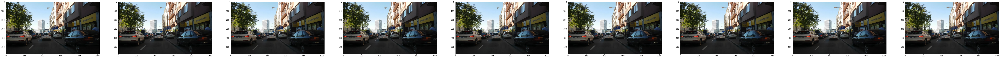

In [ ]:
show_images(input_images)

In [ ]:
"""
Definicja przedmiotu/przeszkody. Będzie ona posiadać id, ramkę, wiek (ile razy została przypisana do przeszkody na innej klatce) i ile razy nie została przypisana do żadnej przeszkody na innej klatce.
"""
class Obstacle():
  def __init__(self, idx, box, age=1, unmatched_age=0):
        self.idx = idx
        self.box = box
        self.age = age
        self.unmatched_age = unmatched_age

In [ ]:
"""
Należy rozwiązać problem fałszywych pozytywów i fałszywych negatywów. W tym celu wprowadzam minimalną liczbę kolejnych wykryć danej przeszkody oraz maksymalną liczbę przypadków, 
kiedy nie zostanie ona przypisana do żadnej przeszkody na kolejnych klatkach. Jeśli przeszkoda zostanie wykryta tylko raz, a potem już nie, zakładamy, że był to fałszywy pozytyw i jej nie wyświetlamy. 
Jeśli natomiast nie zostanie przypisana, będzie z początku wyświetlana dalej (zakładamy, że był to fałszywy negatyw), dopiero kolejny brak przypisania spowoduje niewyświetlenie ramki. 

"""

MIN_HIT_STREAK = 1
MAX_UNMATCHED_AGE = 2

In [ ]:
"""
Funkcja przypisująca ID do koloru - oczywiście, skoro zwracamy RGB, wartości
muszą być mniejsze niż 255
"""
def id_to_color(idx):
    red = idx*23 %256
    green = idx*36 %256
    blue = idx*5 % 256
    return (red, green, blue)

IOU wyliczam na podstawie [tego artykułu](https://www.pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/).

In [ ]:
def box_coords(box):
    """
    Obliczenie współrzędnych ramki w celu wyliczenia IOU
    """
    x1 = box[0]
    x2 = box[0] + box[2]
    y1 = box[1]
    y2 = box[1]+box[3]
    return x1,y1,x2,y2

def box_iou(box1, box2):
    """
    Wyliczenie IOU
    """
    box1 = box_coords(box1)
    box2 = box_coords(box2)
    xA = max(box1[0], box2[0])
    yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA + 1) * max(0, yB - yA + 1) #abs((xi2 - xi1)*(yi2 - yi1))
    box1_area = (box1[2] - box1[0] + 1) * (box1[3] - box1[1] + 1) #abs((box1[3] - box1[1])*(box1[2]- box1[0]))
    box2_area = (box2[2] - box2[0] + 1) * (box2[3] - box2[1] + 1) #abs((box2[3] - box2[1])*(box2[2]- box2[0]))
    union_area = (box1_area + box2_area) - inter_area
    # compute the IoU
    iou = inter_area/float(union_area)
    return iou

In [ ]:
def associate(old_boxes, new_boxes):
    """
    Funkcja przypisująca przyjmująca ramki z klatki z chwili t-1 oraz z chwili t
    i zwracająca przypisania w formie macierzy, nowe detekcje oraz śledzone obiekty nieprzypisane
    - old_boxes to "stare" ramki z chwili t-1
    - new_boxes to "nowe" ramki z chwili t
    """
    # Definicja macierzy IOU nxm ze starymi i nowymi ramkami
    iou_matrix = np.zeros((len(old_boxes),len(new_boxes)),dtype=np.float32)

    # Iteracja po ramkach i zapisanie w macierzy ich wzajemnych IOU 
    for i,old_box in enumerate(old_boxes):
        for j,new_box in enumerate(new_boxes):
            iou_matrix[i][j] = box_iou(old_box, new_box)

    # Algorytm węgierski na macierzy, funkcja linear_sum_assignment implementuje właśnie ten algorytm
    hungarian_row, hungarian_col = linear_sum_assignment(-iou_matrix) # minus dlatego, że maksymalizujemy IOU
    hungarian_matrix = np.array(list(zip(hungarian_row, hungarian_col))) # macierz przypisań

    # Listy obiektów przypisanych i nieprzypisanych
    matches, unmatched_detections, unmatched_trackers = [], [], []

    # Iterujemy po macierzy przypisań, jeśli przypisany element ma IOU <  0.3, dodajemy go do nieprzypisanych,  
    # w przeciwnym razie do przypisanych
    for h in hungarian_matrix:
        if(iou_matrix[h[0],h[1]]<0.3):
            unmatched_trackers.append(old_boxes[h[0]])
            unmatched_detections.append(new_boxes[h[1]])
        else:
            matches.append(h.reshape(1,2))
    
    if(len(matches)==0):
        matches = np.empty((0,2),dtype=int)
    else:
        matches = np.concatenate(matches,axis=0)
    
    # Iterujemy po starych ramkach, jeśli któraś nie ma przypisanej detekcji, dodajemy do śledzonych nieprzypisanych
    for t,trk in enumerate(old_boxes):
	    if(t not in hungarian_matrix[:,0]):
		    unmatched_trackers.append(trk)
    
    # Iterujemy po nowych ramkach, jeśli nie uda się przypisać, dodajemy do nowych nieprzypisanych
    for d, det in enumerate(new_boxes):
        if(d not in hungarian_matrix[:,1]):
                unmatched_detections.append(det)
    
    return matches, unmatched_detections,unmatched_trackers

## YOLO - funkcja sterująca detekcjami z użyciem algorytmu YOLO. 
Ponieważ wbudowana implementacja *Non Maxima Suppression* (NMS) w OpenCV oblicza NMS zbiorczo dla klasy, a nie dla całej listy, używam [metody Malisiewicza et al.](https://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/).

In [ ]:
def non_max_suppression_fast(boxes, nmsThreshold):
    # Jeśli nie ma ramek, zwraca pustą listę
    boxes = np.array(boxes)
    if len(boxes) == 0:
        return []

    # Lepiej dosłownie zamienić na floaty, bo będzie sporo dzielenia    
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
    # Tu będą przechowywane wybrane	indeksy
    pick = []
    # pobieramy współrzędne ramek
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]+boxes[:,0]
    y2 = boxes[:,3]+boxes[:,1]
    # Obliczenie pól ramek i posortowanie ich po 
    # współrzędnej y2 (prawy dolny róg)
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)
    
    # pętla wykonuje się dopóki lista indeksów nie jest pusta
  
    while len(idxs) > 0:
        # bierzemy ostatni indeks na liście i dodajemy jego wartość do wybranych
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)
        # znajdujemy największe współrzędne dla początku ramki (x, y)
        # i najmniejsze dla jej (x, y) końca
        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])
        # obliczamy długość i szerokość ramki
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        # obliczamy stopień, w jakim ramka się nakłada
        overlap = (w * h) / area[idxs[:last]]
        # usunięcie wszystkich indeksów z listy, gdzie nakładanie jest większe
        # niż próg 
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > nmsThreshold)[0])))
    # Zwrot wybranych ramek
    return boxes[pick].astype("int").tolist(), np.array(pick)
    
class YOLO():
    def __init__(self):
        """
        - YOLO na wejściu przyjmuje obraz i trzeba określić jego wymiary.
        - Często jest to 416x416, ale tu dla przyspieszenia bierzemy 320x320.
        - Należy określić próg confidence i NMS
        - Ładowanie klas, konfiguracji modelu (plik cfg) i wag z uprzednio
          wytrenowanego modelu (plik weights) do zmiennych
          (wagi te zależą od rozmiaru obrazu i da się je pobrać ze strony YOLO).
        - Ładowanie sieci CNN DarkNet za pomocą OpenCV.dnn
        - Tu dla uproszczenia używam CPU, bo instalacja CUDA na Google Colab bywa
        problematyczna, a jest potrzebna do tego, by użyć GPU
        """
        self.confThreshold = 0.5
        self.nmsThreshold = 0.55
        self.inpWidth = 320
        self.inpHeight = 320
        classesFile = "/content/drive/My Drive/Colab Notebooks/YOLO/coco.names"
        self.classes = None
        with open(classesFile,'rt') as f:
            self.classes = f.read().rstrip('\n').split('\n')
        modelConfiguration = "/content/drive/My Drive/Colab Notebooks/YOLO/yolov3.cfg";
        modelWeights = "/content/drive/My Drive/Colab Notebooks/YOLO/yolov3.weights";
        self.net = cv2.dnn.readNetFromDarknet(modelConfiguration, modelWeights)
        self.net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
        self.net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

    def getOutputsNames(self):
        '''
        Pobranie nazw warstw wyjściowych
        '''
        # Nazwy wszystkich warstw w sieci
        layersNames = self.net.getLayerNames()
        # Zwrócenie nazw wyjściowych
        return [layersNames[i[0] - 1] for i in self.net.getUnconnectedOutLayers()]


    def drawPred(self, frame, classId, conf, left, top, right, bottom):
        '''
        Narysowanie ramki wokół wykrytego obiektu wg przekazanych współrzędnych
        Później użyjemy tego także do wyświetlania ID.
        '''
        # Ramka.
        cv2.rectangle(frame, (left, top), (right, bottom), (255, 0, 0), thickness=5)
        label = '%.2f' % conf
        # Klasa i jej prawdopodobieństwo
        if self.classes:
            assert(classId < len(self.classes))
            label = '%s:%s' % (self.classes[classId], label)

        # Wyświetlenie klasy na górze, jeśli byłoby potrzebne
        labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        top = max(top, labelSize[1])
        cv2.putText(frame, label, (left, top), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), thickness=3)
        return frame

    def postprocess(self,frame, outs):
        """
        Obróbka końcowa. Przyjmuje wynik z CNN i przygotowuje go w celu zastosowania NMS i progu ufności. 
        Następnie wynikowe ramki zostaną narysowane za pomocą drawPred.
        """
        frameHeight = frame.shape[0]
        frameWidth = frame.shape[1]
        classIds = []
        confidences = []
        boxes = []
        # Iterujemy po ramkach otrzymanych z CNN i zatrzymujemy tylko te z wynikiem ufności ponad progiem.
        # Ramka zostaje sklasyfikowana jako należąca do klasy z najwyższą ufnością.
    
        for out in outs:
            for detection in out:
                scores = detection[5:]
                classId = np.argmax(scores)
                confidence = scores[classId]
                if confidence > self.confThreshold:
                    center_x = int(detection[0] * frameWidth)
                    center_y = int(detection[1] * frameHeight)
                    width = int(detection[2] * frameWidth)
                    height = int(detection[3] * frameHeight)
                    left = int(center_x - width / 2)
                    top = int(center_y - height / 2)
                    classIds.append(classId)
                    confidences.append(float(confidence))
                    boxes.append([left, top, width, height])
        # NMS w celu wyeliminowania nakładających się ramek o niskiej ufności
        #indices = cv2.dnn.NMSBoxes(boxes, confidences, self.confThreshold, self.nmsThreshold) # tak można użyć NMS wbudowanego w OpenCV
        filtered_boxes = []
        if len(boxes)>0:
            filtered_boxes, indices = non_max_suppression_fast(boxes, self.nmsThreshold) # metoda Malisiewicza do NMS
            for idx, box in enumerate(filtered_boxes):
                i = indices[idx]
                left, top, width, height = box
                output_image = self.drawPred(frame,classIds[i], confidences[i], left, top, left + width, top + height)
        
        return frame, filtered_boxes
        
    def inference(self,image):
        """
        Funkcja sterująca siecią neuronową i zwracaniem wyników.
        Wejście: Obraz
        Wyjście: Klatka z narysowanymi ramkami
        """
        # Zamiana klatki na blob 4D.
        blob = cv2.dnn.blobFromImage(image, 1/255, (self.inpWidth, self.inpHeight), [0,0,0], 1, crop=False)
        # Podanie bloba na wejście CNN.
        self.net.setInput(blob)
        # Przekazanie do przodu i zapisanie wyniku w zmiennej
        outs = self.net.forward(self.getOutputsNames())
        # Wywołanie obróbki końcowej w celu zastosowania progu ufności i NMS oraz nakreślenia ramek.
        final_frame, boxes = self.postprocess(image, outs)
        return final_frame, boxes

## Główna pętla sterująca

In [ ]:
def main(input_image):
    """
    Na wejściu przyjmuje obraz
    Zwraca obraz wynikowy i listę wykrytych obiektów(przeszkód) 
    """
    global stored_obstacles # Wykryte obiekty
    global idx # ID obiektów
    # Wykrywanie obiektów
    image = copy.deepcopy(input_image)
    _, out_boxes = yolo.inference(input_image)
    
    # W pierwszej iteracji tworzymy przeszkody z age=1, zgodnie z konstruktorem klasy
    if (idx == 0):
        stored_obstacles = []
        for i, box in enumerate(out_boxes):
            obs = Obstacle(idx, box)
            stored_obstacles.append(obs)                
            idx +=1
        return image
    
    # Jeśli ramka została już przypisana, jej wyświetlenie zależy od wartości zmiennej MIN_HIT_STREAK
    elif (idx != 0): # Jeśli mamy przeszkody z poprzedniej klatki stosujemy przypisanie za pomocą algorytmu węgierskiego
        # Zanim zastosujemy algorytm węgierski, potrzebne są współrzędne ramek już znanych przeszkód
        old_obstacles = [obs.box for obs in stored_obstacles] # Pobieramy te współrzędne
        matches, unmatched_detections, unmatched_tracks = associate(old_obstacles, out_boxes) # Dokonujemy przypisania (bądź nie)
        
        selected_obstacles = []
        # Iterujemy po przypisanych ramkach i dodajemy je jako przeszkody
        new_obstacles = []
        for match in matches:
            obs = Obstacle(stored_obstacles[match[0]].idx, out_boxes[match[1]], stored_obstacles[match[0]].age +1) # Increase the age by 1
            new_obstacles.append(obs)
            if obs.age >= MIN_HIT_STREAK:
                selected_obstacles.append(obs)
        
        # Teraz robimy to samo z nieprzypisanymi ramkami, do ich wyboru stosujemy
        # także zmienną MAX_UNMATCHED_AGE
        for new_obs in unmatched_detections:
            idx +=1
            obs = Obstacle(idx, new_obs)
            new_obstacles.append(obs)
            if obs.age >= MIN_HIT_STREAK:
                selected_obstacles.append(obs)

        for i, old_obs in enumerate(unmatched_tracks):
            if stored_obstacles[i].box == old_obs:
                obs = stored_obstacles[i] 
                obs.unmatched_age +=1
                if obs.unmatched_age <= MAX_UNMATCHED_AGE:
                    selected_obstacles.append(obs)

        # Rysujemy tylko przeszkody spełniające warunki
        for i, obs in enumerate(selected_obstacles):
            left, top, right, bottom = box_coords(obs.box)
            cv2.rectangle(image, (left, top), (right, bottom), id_to_color(obs.idx), thickness=10)
            image = cv2.putText(image, str(obs.idx),(left,top),cv2.FONT_HERSHEY_SIMPLEX, 1,id_to_color(obs.idx),thickness=4)                

        stored_obstacles = copy.deepcopy(new_obstacles)
        return image

## Efekt działania na klatkach ze zbioru danych.

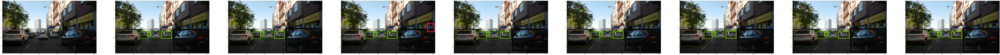

In [ ]:
yolo = YOLO()
idx = 0

fig=plt.figure(figsize=(250, 250))

result_images = copy.deepcopy(input_images)

out_imgs = []

for i in range(len(result_images)):
    out_img = main(result_images[i])
    out_imgs.append(out_img)
    fig.add_subplot(1, len(result_images), i+1)
    plt.imshow(out_imgs[i])

plt.show()

In [ ]:
idx = 0
detector = YOLO()
video_file = "/content/drive/My Drive/Colab Notebooks/YOLO/Clips/clip.mp4"
clip = VideoFileClip(video_file).subclip(0,10)
white_clip = clip.fl_image(main)
%time white_clip.write_videofile("/content/drive/My Drive/Colab Notebooks/YOLO/Clips/outp_clip_10.mp4",audio=False)

[MoviePy] >>>> Building video /content/drive/My Drive/Colab Notebooks/YOLO/Clips/outp_clip_10.mp4
[MoviePy] Writing video /content/drive/My Drive/Colab Notebooks/YOLO/Clips/outp_clip_10.mp4


100%|█████████▉| 300/301 [09:30<00:01,  1.90s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/drive/My Drive/Colab Notebooks/YOLO/Clips/outp_clip_10.mp4 

CPU times: user 12min 29s, sys: 5.95 s, total: 12min 35s
Wall time: 9min 55s


## Tak wygląda wynikowy plik wideo.

Został on wykonany w oparciu o fragment udostępnionych do zadania danych. Format zapisu wyników działania takiego systemu detekcji jest oczywiście dowolny i zależy od tego, co chce się zrobić z wynikami, tu decyduję się na plik wideo, bo chciałem szybko pokazać efekt działania.

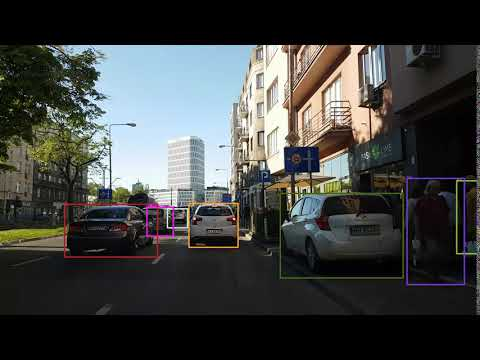

In [ ]:
YouTubeVideo('y5YSTcNM_fw')

# 5. Post scriptum: Możliwości usprawnień i rozbudowy. Uwagi końcowe

Zdaję sobie sprawę, że ta propozycja pozostawia znaczne pole do udoskonaleń. Zapewne lepsze efekty można by uzyskać dokonując finetuningu uprzednio wytrenowanej sieci neuronowej. Ponadto dosłownie w ostatnich miesiącach pojawiły się wersja 4 i 5 algorytmu YOLO (nie są one już dziełem jego oryginalnych twórców, Redmonda i Farhadiego, lecz usprawnieniami dokonanymi przez ich kontynuatorów) - można by pokusić się o ich wprowadzenie, przy czym wersja 5 nie działa już w oparciu o DarkNet.

Gdyby zaistniała konieczność lepszej obsługi obiektów zasłoniętych, albo lepszego prognozowania drogi obiektów na podstawie danych telemetrycznych można by pokusić się o zastosowanie filtrów Kalmana.
